## Import libraries


In [134]:
import math
import os
from glob import glob

import geopandas as gpd
import leafmap
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import rasterio as rio
import seaborn as sns
import xarray as xr
from tqdm.auto import tqdm

data_dir = "/data01/FDS/muduchuru/Land/hb_houston/data"

## Read the region of interest


In [104]:
Map = leafmap.Map()
Map

Map(center=[20, 0], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_text…

(16, 4)


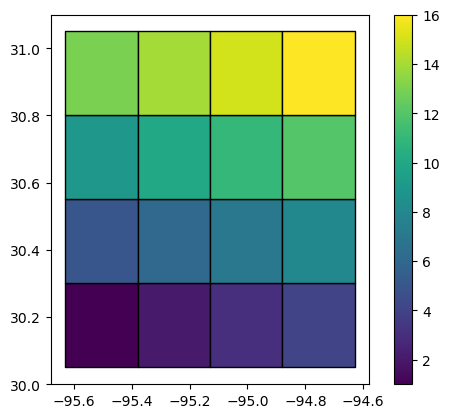

In [105]:
domain_gdf = gpd.read_file(os.path.join(data_dir, "shp", "domain.shp"))
print(domain_gdf.shape)
domain_gdf.plot(column="ID", edgecolor="k", legend=True)

Map.add_gdf(domain_gdf, layer_name="Domain")
Map.zoom_to_gdf(domain_gdf)

## Choose the CID and get the file names


In [106]:
cid = 2  # Ranges between 1-16
cid_folder_path = os.path.join(data_dir, "cids", str(cid))
cid_file_names = os.listdir(cid_folder_path)

print("Number of files:", len(cid_file_names))
list(sorted(cid_file_names))

Number of files: 48


['acc_latlon.tif',
 'admin_latlon.tif',
 'basins_latlon.tif',
 'bb',
 'clay',
 'dbedrock_latlon.tif',
 'dem_latlon.tif',
 'dsat',
 'f11_latlon.tif',
 'fdir_latlon.tif',
 'hb',
 'ksat',
 'lambda',
 'lc_latlon.tif',
 'log.txt',
 'lwdown.nc',
 'lwdown_latlon_coarse.tif',
 'lwdown_latlon_fine.tif',
 'mask_latlon.tif',
 'mask_org_latlon.tif',
 'om',
 'precip.nc',
 'precip_latlon_coarse.tif',
 'precip_latlon_fine.tif',
 'psisat',
 'psurf.nc',
 'psurf_latlon_coarse.tif',
 'psurf_latlon_fine.tif',
 'qtz',
 'sand',
 'silt',
 'spfh.nc',
 'spfh_latlon_coarse.tif',
 'spfh_latlon_fine.tif',
 'swdown.nc',
 'swdown_latlon_coarse.tif',
 'swdown_latlon_fine.tif',
 'tair.nc',
 'tair_latlon_coarse.tif',
 'tair_latlon_fine.tif',
 'texture_class',
 'theta1500',
 'theta33',
 'thetar',
 'thetas',
 'wind.nc',
 'wind_latlon_coarse.tif',
 'wind_latlon_fine.tif']

## 1. Topography & River Network

**Source:** USGS National Elevation Dataset (NED) at 1 arcsec (~30 m) resolution.

**Purpose:** Used to delineate watersheds, river networks, and calculate slope and flow accumulation.

**Mapped Files:**

- **`dem_latlon.tif`**: The raw Digital Elevation Model input.

- **`fdir_latlon.tif`**: Flow direction map (derived d8 flow direction mentioned in **Section 2.4** ).

- **`acc_latlon.tif`**: Flow accumulation area. The paper notes this is used as a feature predictor for clustering watersheds.

- **`basins_latlon.tif`**: The field-scale map of delineated watersheds used as building blocks for HRUs.

- **`mask_latlon.tif` / `mask_org_latlon.tif`**: Domain masks defining the study area.


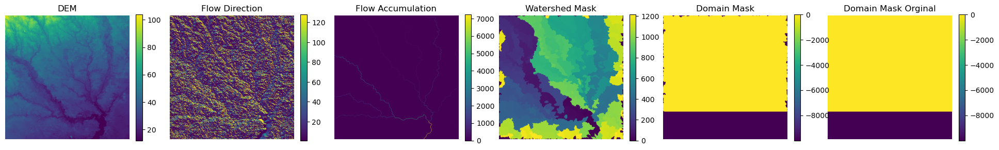

In [ ]:
topo_river_file_paths = {
    "DEM": os.path.join(cid_folder_path, "dem_latlon.tif"),
    "Flow Direction": os.path.join(cid_folder_path, "fdir_latlon.tif"),
    "Flow Accumulation": os.path.join(cid_folder_path, "acc_latlon.tif"),
    "Watershed Mask": os.path.join(cid_folder_path, "basins_latlon.tif"),
    "Domain Mask": os.path.join(cid_folder_path, "mask_latlon.tif"),
    "Domain Mask Orginal": os.path.join(cid_folder_path, "mask_org_latlon.tif"),
}

fig, axes = plt.subplots(
    nrows=1,
    ncols=len(topo_river_file_paths),
    figsize=(4 * len(topo_river_file_paths), 4),
)
axes = axes.flatten()

for i, (name, path) in enumerate(topo_river_file_paths.items()):
    with rio.open(path, "r") as src:
        data = src.read(1)
        meta = src.meta

    if name in ["Flow Accumulation", "Watershed Mask"]:
        im = axes[i].imshow(data, vmin=0)
    else:
        im = axes[i].imshow(data)

    axes[i].set_title(name)
    axes[i].axis("off")
    plt.colorbar(im, ax=axes[i], fraction=0.046)

## 2. Soil Properties

**Source:** POLARIS soil properties database at 1 arcsec (~30 m) resolution.

**Purpose:** Provides soil hydraulic properties for solving Richards' equation and Darcy flux between HRUs.

**Mapped Files:**

- **Texture:** `clay` (percent clay), `sand`, `silt`, `texture_class`.
- **Hydraulic Properties:**
  - `ksat`: Saturated hydraulic conductivity.
  - `thetas` / `thetar`: Saturated and residual soil moisture content.
  - `theta1500` / `theta33`: Soil moisture at wilting point (1500 kPa) and field capacity (33 kPa).
  - `bb`: The "b" parameter (pore size distribution) for the Clapp-Hornberger relationships.
  - `psisat`: Air entry pressure (saturated soil suction).
  - `om`: Organic matter content.


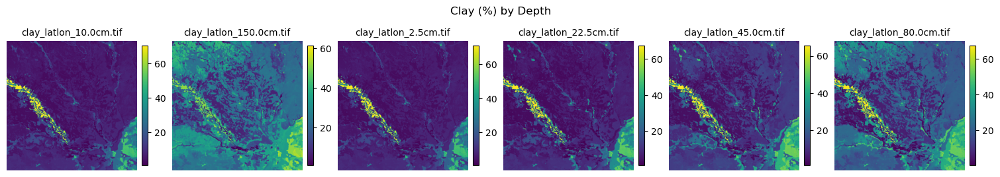

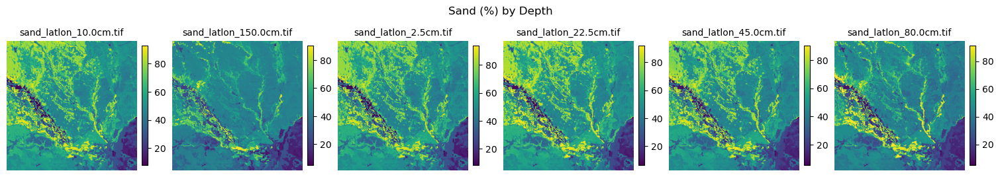

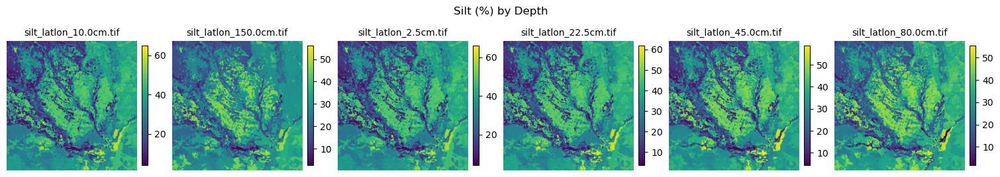

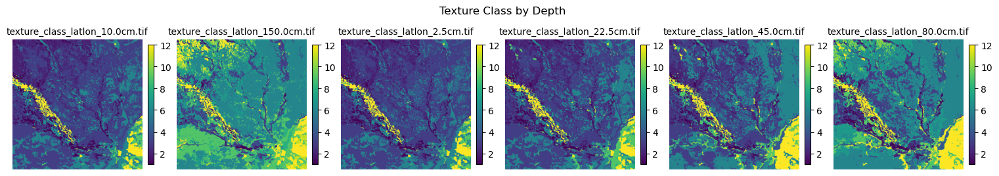

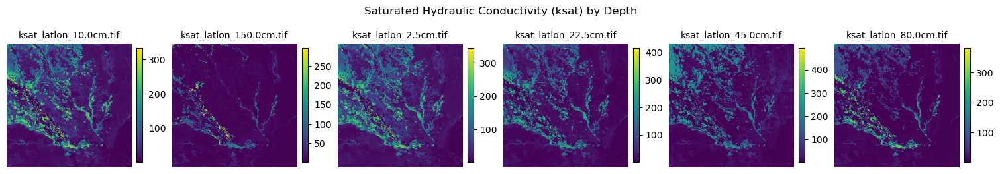

...

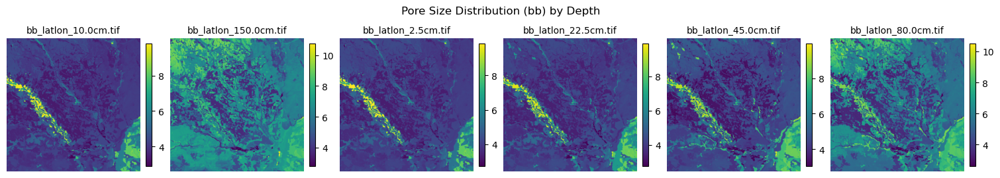

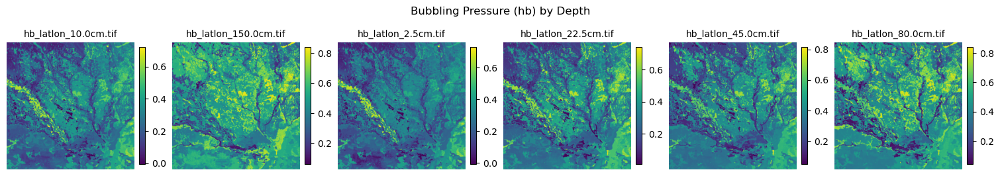

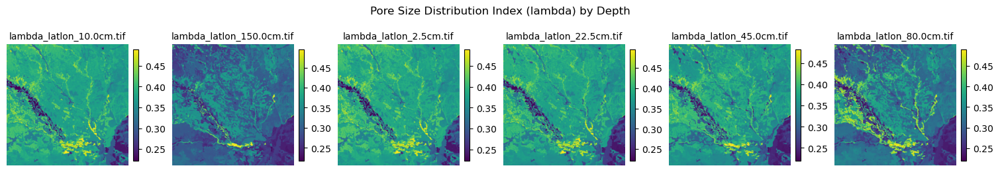

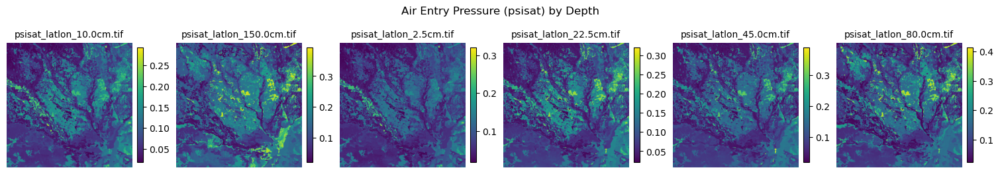

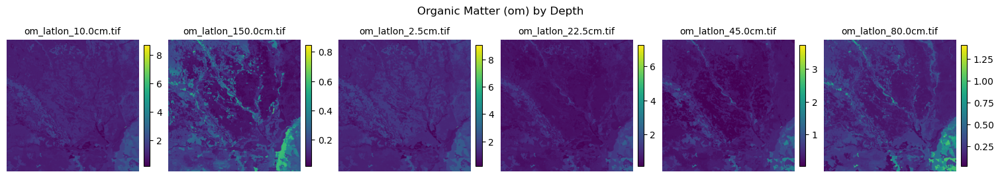

In [188]:
soil_properties = {
    # Texture
    "Clay (%)": "clay",
    "Sand (%)": "sand",
    "Silt (%)": "silt",
    "Texture Class": "texture_class",
    # Hydraulic Properties
    "Saturated Hydraulic Conductivity (ksat)": "ksat",
    "Saturated Soil Water Content (thetas)": "thetas",
    "Residual Soil Water Content (thetar)": "thetar",
    "Field Capacity (theta33)": "theta33",
    "Wilting Point (theta1500)": "theta1500",
    "Pore Size Distribution (bb)": "bb",
    "Bubbling Pressure (hb)": "hb",
    "Pore Size Distribution Index (lambda)": "lambda",
    "Air Entry Pressure (psisat)": "psisat",
    "Organic Matter (om)": "om",
}

for property_name, folder_name in soil_properties.items():
    folder_path = os.path.join(cid_folder_path, folder_name)

    if not os.path.exists(folder_path):
        print(
            f"Skipping {property_name}: Folder '{folder_name}' not found at {folder_path}"
        )
        continue

    depth_files = sorted(glob(os.path.join(folder_path, "*.tif")))

    if not depth_files:
        print(f"Skipping {property_name}: No .tif files found in {folder_path}")
        continue

    num_files = len(depth_files)
    cols = 6
    rows = math.ceil(num_files / cols)

    fig, axes = plt.subplots(
        rows, cols, figsize=(15, 5 * rows), constrained_layout=True
    )

    if num_files == 1:
        axes = [axes]
    else:
        axes = axes.flatten()

    fig.suptitle(f"{property_name} by Depth", fontsize=12, y=0.8)

    for i, file_path in enumerate(depth_files):
        try:
            with rio.open(file_path) as src:
                data = src.read(1)
                meta = src.meta

                if src.nodata is not None:
                    data = np.ma.masked_equal(data, src.nodata)

                im = axes[i].imshow(data, cmap="viridis")
                axes[i].set_title(os.path.basename(file_path), fontsize=10)
                axes[i].axis("off")

                plt.colorbar(im, ax=axes[i], fraction=0.046, pad=0.04)

        except Exception as e:
            print(f"Error reading {file_path}: {e}")
            axes[i].text(0.5, 0.5, "Error reading file", ha="center", va="center")

    for j in range(i + 1, len(axes)):
        axes[j].axis("off")

    plt.show()

## 3. Meteorological Forcing

**Source:** Princeton CONUS Forcing (PCF) dataset at 1/32° (~3 km) resolution. https://ldas.gsfc.nasa.gov/sites/default/files/ldas/nldas/presentations/conus_forcing_4km.pdf

**Purpose:** The system uses a split-data approach to handle spatial heterogeneity and temporal dynamics separately:

1. **Temporal Dynamics:** The **NetCDF files (`.nc`)** contain the actual hourly meteorological time-series data for the simulation period (10 years).

2. **Spatial Gradients:** The **`*_latlon_*.tif` files** (coarse and fine) represent the **latitude and longitude coordinates** corresponding to the forcing grids. These files are used as covariates during the hierarchical clustering process.
   - By using latitude and longitude as features in the clustering (K-means), the model ensures that the generated HRUs capture the "location-driven differences in atmosphere forcing".

   - The "fine" files provide the 30 m resolution coordinates needed to assign each pixel to an HRU, while the "coarse" files likely provide the reference coordinates for the 3 km forcing grid.

**Mapped Files:**

- **`precip.nc`**: Hourly precipitation time series.
- **`precip_latlon_coarse.tif` / `precip_latlon_fine.tif`**: Latitude/Longitude gradients for the precipitation grid (used to map the 3km forcing to the 30m HRUs).
- **`tair.nc`** / **`tair_latlon_*.tif`**: Air temperature (time series and spatial coordinates).
- **`swdown.nc`** / **`swdown_latlon_*.tif`**: Incoming shortwave radiation.
- **`lwdown.nc`** / **`lwdown_latlon_*.tif`**: Incoming longwave radiation.
- **`psurf.nc`** / **`psurf_latlon_*.tif`**: Surface pressure.
- **`spfh.nc`** / **`spfh_latlon_*.tif`**: Specific humidity.
- **`wind.nc`** / **`wind_latlon_*.tif`**: Wind speed.


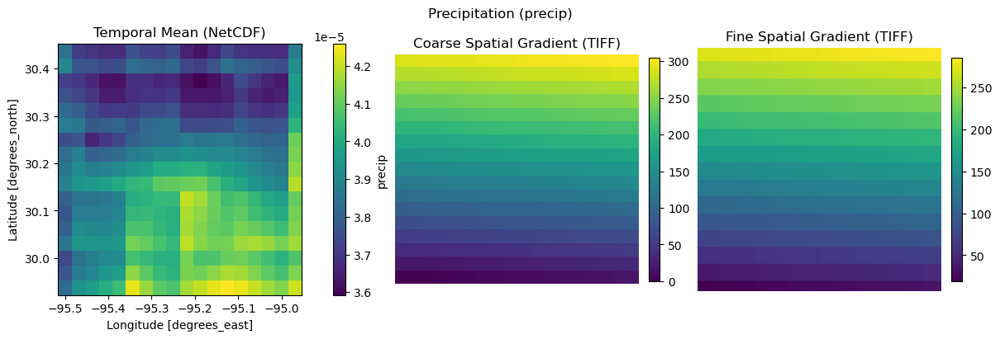

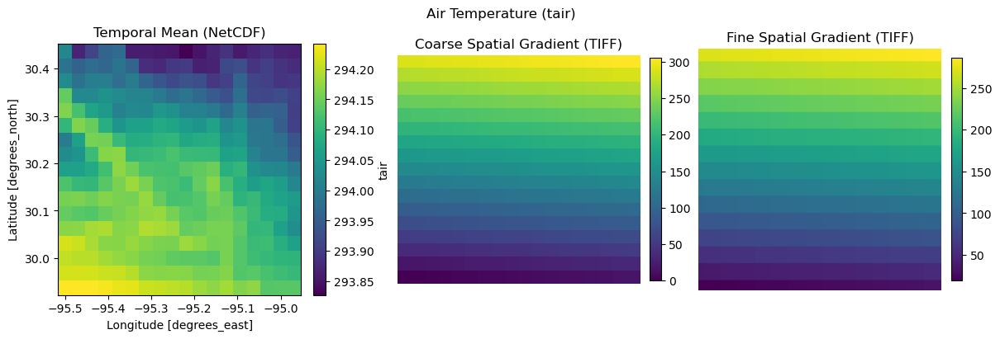

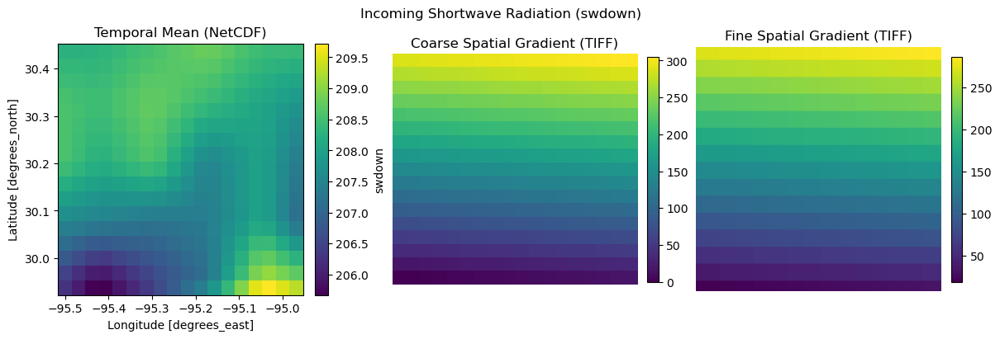

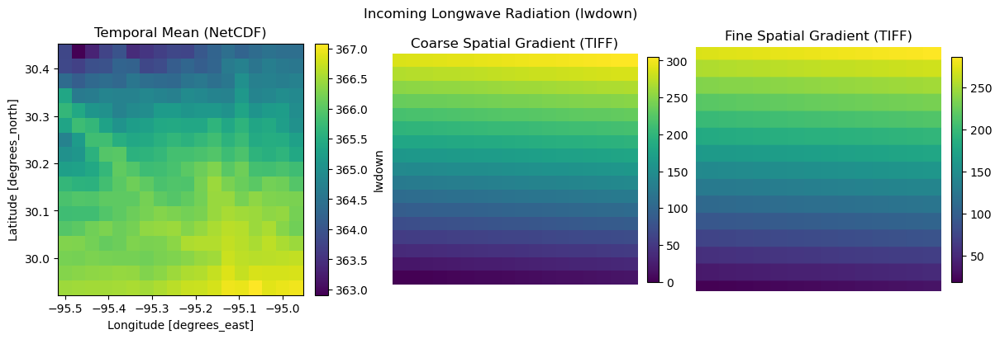

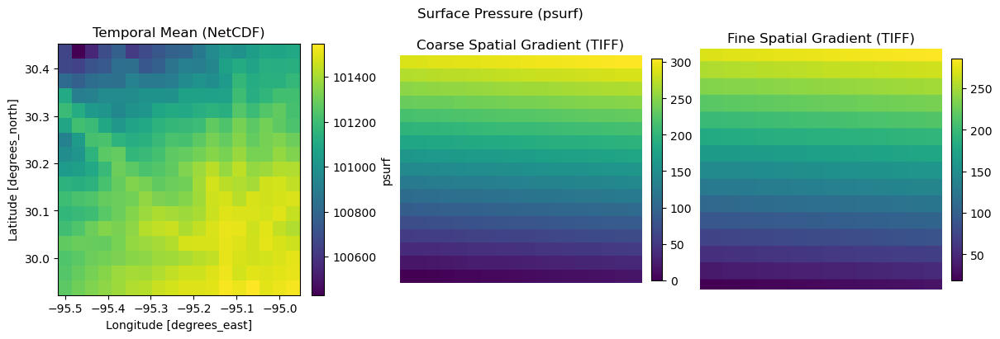

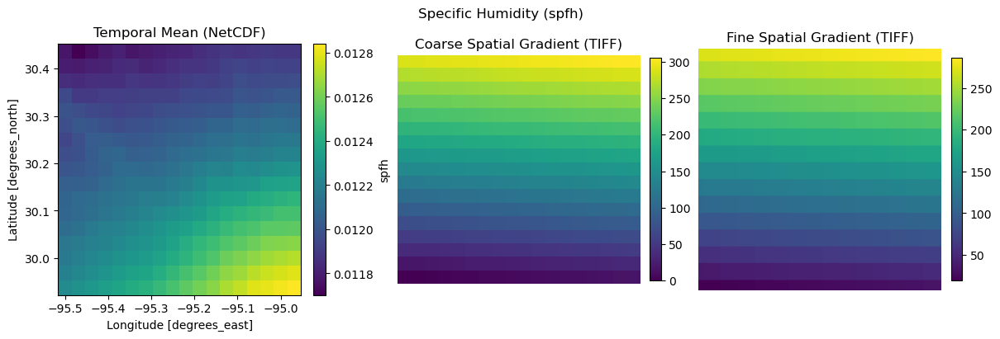

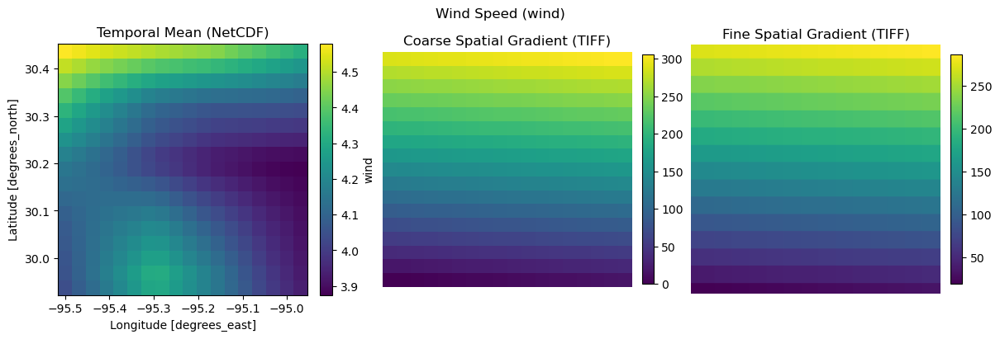

In [189]:
met_variables = {
    "precip": "Precipitation",
    "tair": "Air Temperature",
    "swdown": "Incoming Shortwave Radiation",
    "lwdown": "Incoming Longwave Radiation",
    "psurf": "Surface Pressure",
    "spfh": "Specific Humidity",
    "wind": "Wind Speed",
}

for var_code, var_name in met_variables.items():

    nc_path = os.path.join(cid_folder_path, f"{var_code}.nc")
    coarse_tif_path = os.path.join(cid_folder_path, f"{var_code}_latlon_coarse.tif")
    fine_tif_path = os.path.join(cid_folder_path, f"{var_code}_latlon_fine.tif")

    fig, axes = plt.subplots(1, 3, figsize=(12, 4), constrained_layout=True)
    fig.suptitle(f"{var_name} ({var_code})", fontsize=12)

    if os.path.exists(nc_path):
        try:
            ds = xr.open_dataset(nc_path, decode_times=False)

            if var_code in ds:
                data = ds[var_code]
            else:
                data = ds[list(ds.data_vars)[0]]

            # Calculate Mean over 't' dimension
            mean_val = data.mean(dim="t", keep_attrs=True)

            mean_val.plot(ax=axes[0], cmap="viridis")
            axes[0].set_title("Temporal Mean (NetCDF)")
        except Exception as e:
            axes[0].text(
                0.5,
                0.5,
                f"Error reading NetCDF:\n{e}",
                ha="center",
                va="center",
                wrap=True,
            )
            axes[0].axis("off")
    else:
        axes[0].text(0.5, 0.5, "NetCDF File Not Found", ha="center", va="center")
        axes[0].axis("off")

    if os.path.exists(coarse_tif_path):
        try:
            with rio.open(coarse_tif_path) as src:
                coarse_data = src.read(1)
                if src.nodata is not None:
                    coarse_data = np.ma.masked_equal(coarse_data, src.nodata)

                im2 = axes[1].imshow(coarse_data, cmap="viridis")
                axes[1].set_title("Coarse Spatial Gradient (TIFF)")
                plt.colorbar(im2, ax=axes[1], fraction=0.046, pad=0.04)
                axes[1].axis("off")
        except Exception as e:
            axes[1].text(
                0.5,
                0.5,
                f"Error reading Coarse TIF:\n{e}",
                ha="center",
                va="center",
                wrap=True,
            )
            axes[1].axis("off")
    else:
        axes[1].text(0.5, 0.5, "Coarse TIF Not Found", ha="center", va="center")
        axes[1].axis("off")

    if os.path.exists(fine_tif_path):
        try:
            with rio.open(fine_tif_path) as src:
                fine_data = src.read(1)
                # Mask nodata if present
                if src.nodata is not None:
                    fine_data = np.ma.masked_equal(fine_data, src.nodata)

                im3 = axes[2].imshow(fine_data, cmap="viridis")
                axes[2].set_title("Fine Spatial Gradient (TIFF)")
                plt.colorbar(im3, ax=axes[2], fraction=0.046, pad=0.04)
                axes[2].axis("off")
        except Exception as e:
            axes[2].text(
                0.5,
                0.5,
                f"Error reading Fine TIF:\n{e}",
                ha="center",
                va="center",
                wrap=True,
            )
            axes[2].axis("off")
    else:
        axes[2].text(0.5, 0.5, "Fine TIF Not Found", ha="center", va="center")
        axes[2].axis("off")

    plt.show()

## 4. Land Cover

**Source:** National Land Cover Database (NLCD).

**Purpose:** Determines vegetation parameters and is used as a covariate for clustering HRUs (intra-band clusters).

**Mapped Files:**

- **`lc_latlon.tif`**: The land cover classification map.


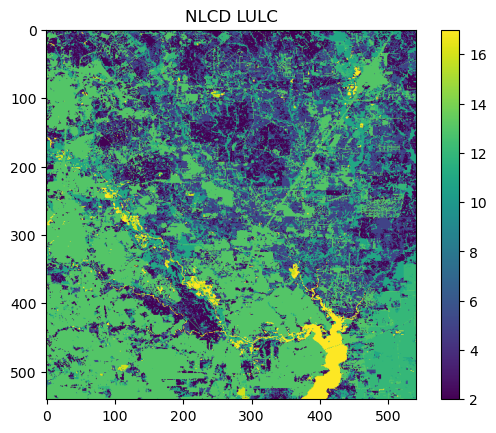

In [ ]:
lulc_file_path = os.path.join(cid_folder_path, "lc_latlon.tif")

with rio.open(lulc_file_path) as src:
    data = src.read(1)
    meta = src.meta

plt.imshow(data)
plt.title("NLCD LULC")
plt.colorbar()